Need to have tensorflow, open-cv and tensorflow_datasets installed

In [1]:
import tensorflow as tf
import cv2
import numpy as np
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

# Load Dataset

In [2]:
ds = tfds.load('deep_weeds', batch_size = -1, as_supervised = True)

images, labels = ds['train']

Instructions for updating:
Use `tf.data.Dataset.get_single_element()`.


Instructions for updating:
Use `tf.data.Dataset.get_single_element()`.


In [3]:
#Images are stored as tensors
images[0]

<tf.Tensor: shape=(256, 256, 3), dtype=uint8, numpy=
array([[[200, 213, 230],
        [213, 225, 239],
        [245, 255, 255],
        ...,
        [ 85, 127, 107],
        [ 62,  67,  63],
        [ 77,  65,  67]],

       [[199, 212, 229],
        [224, 236, 250],
        [232, 242, 251],
        ...,
        [ 52,  89,  72],
        [ 61,  66,  62],
        [ 81,  69,  71]],

       [[158, 170, 186],
        [230, 242, 255],
        [247, 255, 255],
        ...,
        [180, 206, 195],
        [123, 125, 122],
        [ 84,  73,  77]],

       ...,

       [[ 33,  36,  43],
        [ 33,  36,  43],
        [ 31,  35,  44],
        ...,
        [186, 192, 206],
        [ 68,  74,  88],
        [ 88,  94, 108]],

       [[ 36,  36,  44],
        [ 33,  36,  43],
        [ 31,  35,  44],
        ...,
        [103, 109, 123],
        [ 94, 100, 114],
        [ 58,  64,  78]],

       [[ 36,  36,  44],
        [ 33,  36,  43],
        [ 32,  35,  44],
        ...,
        [ 26,  32,  4

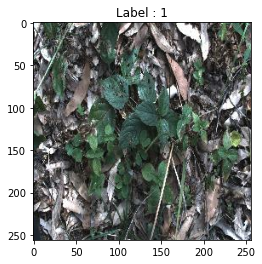

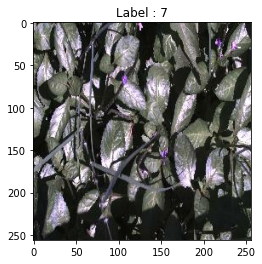

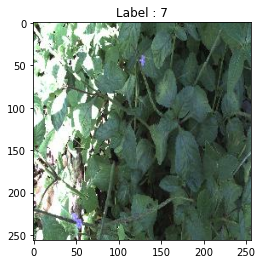

In [4]:
#Check some images
for i in range(3):
    fig , ax = plt.subplots()
    ax.imshow(images[i])
    ax.set_title("Label : " + str(labels[i].numpy()))

In [5]:
img_0 = tf.gather_nd(images, tf.where(labels == 0))
img_1 = tf.gather_nd(images, tf.where(labels == 1))
img_2 = tf.gather_nd(images, tf.where(labels == 2))
img_3 = tf.gather_nd(images, tf.where(labels == 3))
img_4 = tf.gather_nd(images, tf.where(labels == 4))
img_5 = tf.gather_nd(images, tf.where(labels == 5))
img_6 = tf.gather_nd(images, tf.where(labels == 6))
img_7 = tf.gather_nd(images, tf.where(labels == 7))
img_8 = tf.gather_nd(images, tf.where(labels == 8))

img_sorted = [img_0, img_1, img_2, img_3, img_4, img_5, img_6, img_7, img_8]

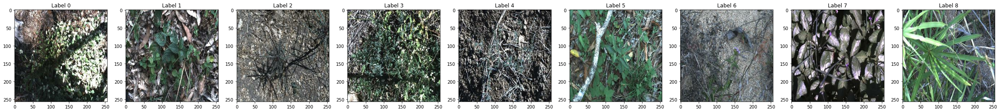

In [6]:
fig = plt.figure(figsize = (40,40))

for i in range(9):
    ax = fig.add_subplot(1, 9, i + 1)
    plt.imshow(img_sorted[i][0])
    ax.set_title(f"Label {i}")

# Feature Engineering

Properties of Images which will be extracted and analysed

1. Average RBG values
2. Average Intensity (Convert to greyscale)
3. Compare Histogram
4. Comparing Edge Pictures
5. Apply filters like the gaussian and take average after
6. Comparing Gradient images

In [7]:
img = images[0]

In [8]:
def normalize_img(img):
    return img/255

normalize_img(img)

<tf.Tensor: shape=(256, 256, 3), dtype=float32, numpy=
array([[[0.78431374, 0.8352941 , 0.9019608 ],
        [0.8352941 , 0.88235295, 0.9372549 ],
        [0.9607843 , 1.        , 1.        ],
        ...,
        [0.33333334, 0.49803922, 0.41960785],
        [0.24313726, 0.2627451 , 0.24705882],
        [0.3019608 , 0.25490198, 0.2627451 ]],

       [[0.78039217, 0.83137256, 0.8980392 ],
        [0.8784314 , 0.9254902 , 0.98039216],
        [0.9098039 , 0.9490196 , 0.9843137 ],
        ...,
        [0.20392157, 0.34901962, 0.28235295],
        [0.23921569, 0.25882354, 0.24313726],
        [0.31764707, 0.27058825, 0.2784314 ]],

       [[0.61960787, 0.6666667 , 0.7294118 ],
        [0.9019608 , 0.9490196 , 1.        ],
        [0.96862745, 1.        , 1.        ],
        ...,
        [0.7058824 , 0.80784315, 0.7647059 ],
        [0.48235294, 0.49019608, 0.47843137],
        [0.32941177, 0.28627452, 0.3019608 ]],

       ...,

       [[0.12941177, 0.14117648, 0.16862746],
        [0.12

Text(0.5, 1.0, 'After')

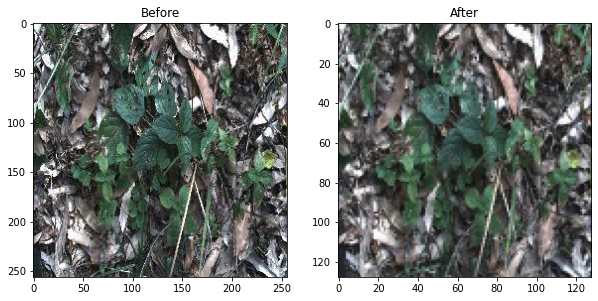

In [9]:
def re_size(img, new_size):
    return cv2.resize(img, new_size)


fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,2,1)
plt.imshow(img)
ax.set_title("Before")



ax = fig.add_subplot(1,2,2)
plt.imshow(re_size(img.numpy(), (128,128)))
ax.set_title("After")

Text(0.5, 1.0, 'After')

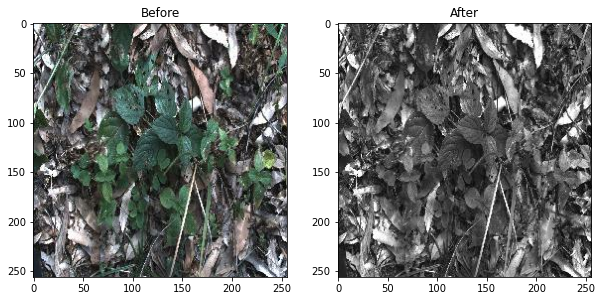

In [10]:
def conv_greyscale(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,2,1)
plt.imshow(img)
ax.set_title("Before")



ax = fig.add_subplot(1,2,2)
plt.imshow(conv_greyscale(img.numpy()), cmap = 'gray')
ax.set_title("After")

# Pre Processing

## Histogram equalization

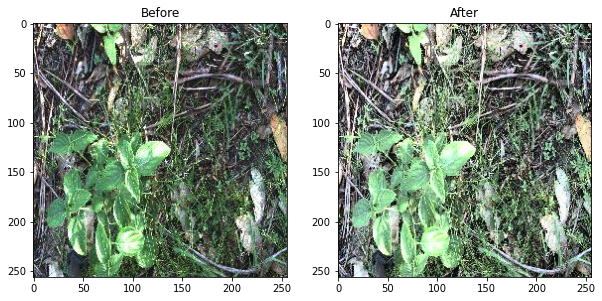

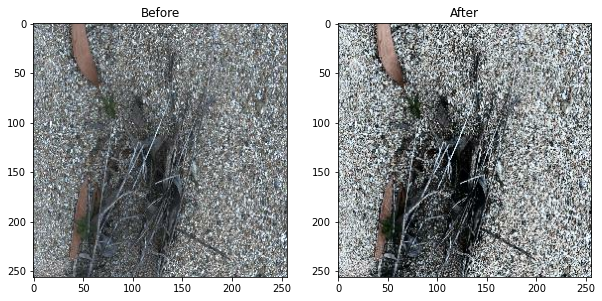

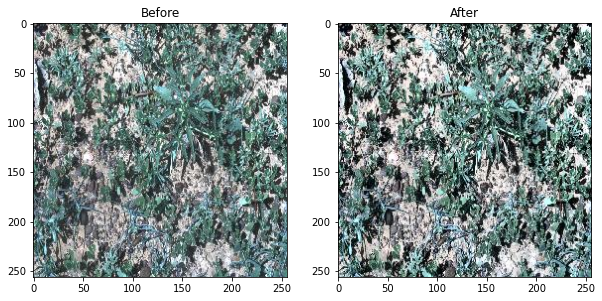

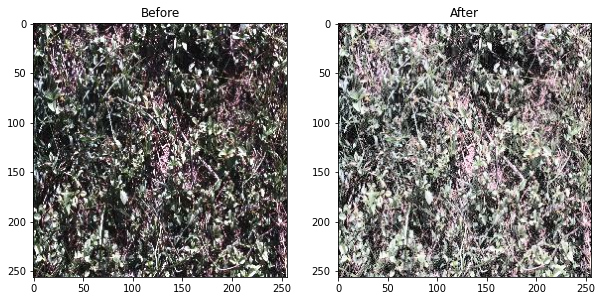

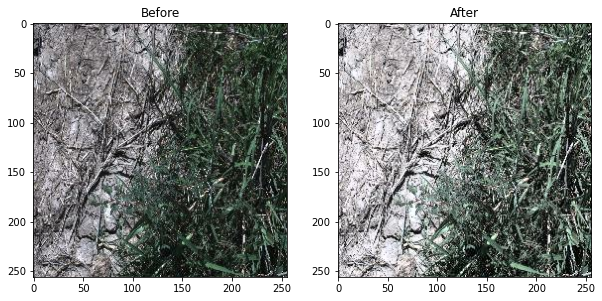

In [11]:
def histogram_equalization(img):
    img_yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
    img_output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
    return img_output

for i in range(5):
    i = np.random.randint(len(images))
    img = images[i].numpy()
    
    fig = plt.figure(figsize = (10,10))
    ax = fig.add_subplot(1,2,1)
    plt.imshow(img)
    ax.set_title("Before")

    img_output = histogram_equalization(img)

    ax = fig.add_subplot(1,2,2)
    plt.imshow(img_output)
    ax.set_title("After")

## Application of Different Blurs

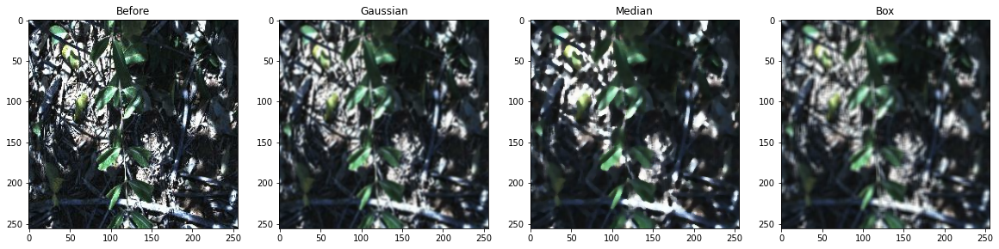

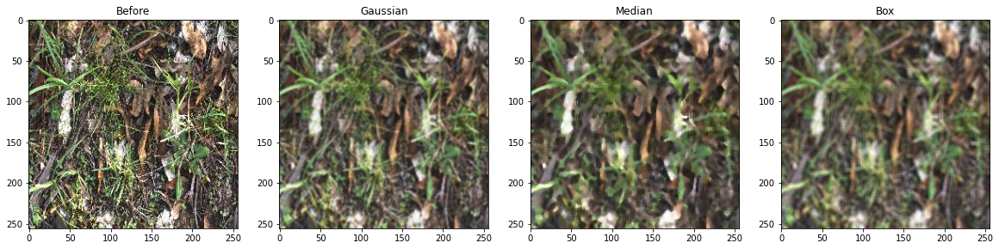

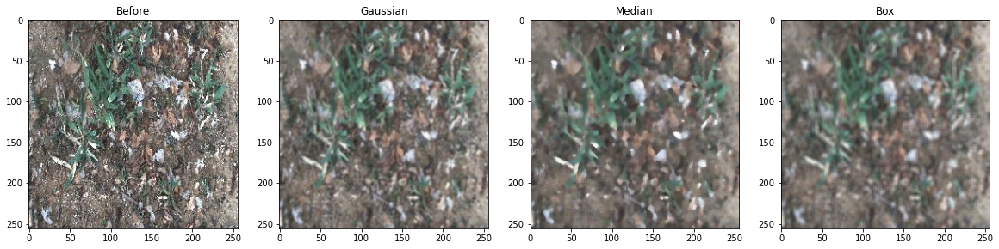

In [12]:
def gaussian_filter(img, kernel_size):
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def median_filter(img, kernel_size):
    return cv2.medianBlur(img, kernel_size)

def box_filter(img, kernel_size):
    return cv2.blur(img , (kernel_size, kernel_size))


for i in range(3):
    i = np.random.randint(len(images))
    img = images[i].numpy()
    fig = plt.figure(figsize = (20,20))
    ax = fig.add_subplot(1,4,1)
    plt.imshow(img)
    ax.set_title("Before")
    
    gaussian = gaussian_filter(img, 5)
    median = median_filter(img , 5)
    box = box_filter(img , 5)
    
    
    ax = fig.add_subplot(1,4,2)
    plt.imshow(gaussian)
    ax.set_title("Gaussian")
    
    ax = fig.add_subplot(1,4,3)
    plt.imshow(median)
    ax.set_title("Median")
    
    ax = fig.add_subplot(1,4,4)
    plt.imshow(box)
    ax.set_title("Box")


## Gradient Images

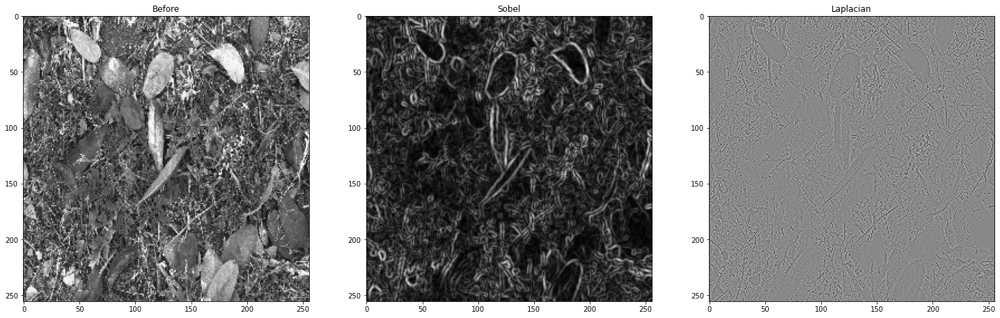

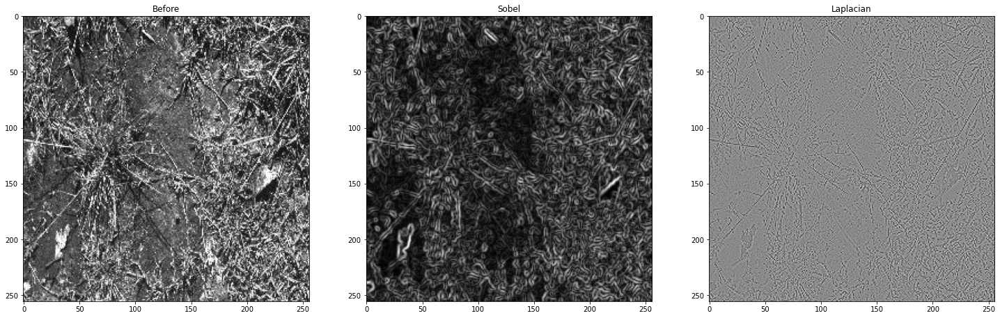

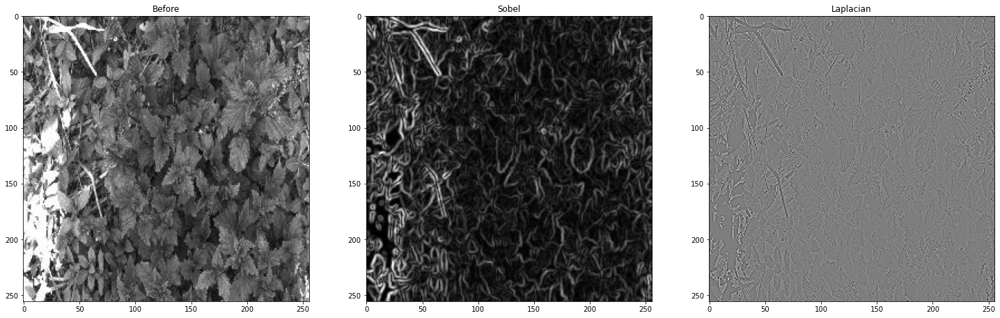

In [13]:
def sobel_filter(img, kernel_size):
    sobelx = cv2.Sobel(img, cv2.CV_64F,1,0, ksize = kernel_size)
    sobely = cv2.Sobel(img, cv2.CV_64F,0,1, ksize = kernel_size)
    sobel = np.sqrt(sobelx**2 + sobely**2)
    return sobel

def laplacian_filter(img):
    return cv2.Laplacian(img, cv2.CV_64F)

for i in range(3):
    i = np.random.randint(len(images))
    img = images[i].numpy()
    img = conv_greyscale(img)
    fig = plt.figure(figsize = (25,25))
    ax = fig.add_subplot(1,3,1)
    plt.imshow(img, cmap = 'gray')
    ax.set_title("Before")
    
    sobel = sobel_filter(img, 5)
    laplacian = laplacian_filter(img)
    
    ax = fig.add_subplot(1,3,2)
    plt.imshow(sobel, cmap = 'gray')
    ax.set_title("Sobel")
    
    ax = fig.add_subplot(1,3,3)
    plt.imshow(laplacian, cmap = 'gray')
    ax.set_title("Laplacian")

# CNN

## Taking a sample and spiting in training and test datasets

In [14]:
train_set = [tf.random.shuffle(img_sorted[i])[:1000] for i in range(9)]
test_set = [tf.random.shuffle(img_sorted[i])[:200] for i in range(9)]

In [15]:
train_img_n_label = []
test_img_n_label = []
for i in range(9):
    for img in train_set[i]:
        train_img_n_label.append((img, i))
    for img in test_set[i]:
        test_img_n_label.append((img, i))

train_img_n_label = np.array(train_img_n_label)
test_img_n_label = np.array(test_img_n_label)

<ipython-input-15-1b08512c37ce>:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  train_img_n_label = np.array(train_img_n_label)
<ipython-input-15-1b08512c37ce>:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  test_img_n_label = np.array(test_img_n_label)


## Shuffle and split into input X and label y

In [31]:
np.random.shuffle(train_img_n_label)

train_X = []
train_y = []


test_X = []
test_y = []


for i in train_img_n_label:
    train_X.append(histogram_equalization(i[0].numpy()))
    train_y.append(i[1])

for i in test_img_n_label:
    test_X.append(histogram_equalization(i[0].numpy()))
    test_y.append(i[1])
    
train_X = np.array(train_X)
train_y = np.array(train_y)

test_X = np.array(test_X)
test_y = np.array(test_y)

In [32]:
from tensorflow.keras import datasets, layers, models, regularizers
import datetime

In [33]:
%load_ext tensorboard

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [35]:
model = models.Sequential()

model.add(layers.Conv2D(32, (5, 5), activation='relu', input_shape=(256, 256, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.BatchNormalization())

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((3, 3)))
model.add(layers.BatchNormalization())

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())

model.add(layers.Flatten())

model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.25))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(9))

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 252, 252, 32)      2432      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 126, 126, 32)      0         
_________________________________________________________________
batch_normalization_3 (Batch (None, 126, 126, 32)      128       
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 124, 124, 64)      18496     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 41, 41, 64)        0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 41, 41, 64)        256       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 39, 39, 64)       

In [39]:
%tensorboard --logdir logs --port 8088

In [40]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])




model.fit(train_X, train_y, epochs=10, 
                    validation_data=(test_X, test_y), callbacks=[tensorboard_callback])

Epoch 1/10
  1/282 [..............................] - ETA: 6:14 - loss: 4.3403 - accuracy: 0.3125WARNING:tensorflow:Trace already enabled


282/282 [==============================] - 285s 1s/step - loss: 2.7375 - accuracy: 0.2374 - val_loss: 12.3913 - val_accuracy: 0.1639
Epoch 2/10
282/282 [==============================] - 285s 1s/step - loss: 1.6543 - accuracy: 0.4031 - val_loss: 1.6126 - val_accuracy: 0.4217
Epoch 3/10
282/282 [==============================] - 284s 1s/step - loss: 1.1964 - accuracy: 0.5774 - val_loss: 4.3122 - val_accuracy: 0.1700
Epoch 4/10
282/282 [==============================] - 283s 1s/step - loss: 0.7893 - accuracy: 0.7251 - val_loss: 0.9742 - val_accuracy: 0.7139
Epoch 5/10
282/282 [==============================] - 283s 1s/step - loss: 0.5552 - accuracy: 0.8137 - val_loss: 1.9027 - val_accuracy: 0.5489
Epoch 6/10
282/282 [==============================] - 286s 1s/step - loss: 0.4289 - accuracy: 0.8634 - val_loss: 0.5362 - val_accuracy: 0.8444
Epoch 7/10
282/282 [==============================] - 314s 1s/step - loss: 0.3343 - accuracy: 0.8956 - val_loss: 2.1436 - val_accuracy: 0.5289
Epoch 8/1

In [41]:
model.evaluate(test_X,test_y)

57/57 [==============================] - 13s 230ms/step - loss: 1.4097 - accuracy: 0.7694


[1.4096565246582031, 0.769444465637207]